# Project - Music Genre Classification

In [1]:
%matplotlib inline

import warnings
from numba.core.errors import NumbaDeprecationWarning, NumbaPendingDeprecationWarning

warnings.filterwarnings("ignore", message=".*The 'nopython' keyword.*")
warnings.simplefilter('ignore', category=NumbaDeprecationWarning)

import pandas as pd
import numpy as np
from ydata_profiling import ProfileReport

import matplotlib.pyplot as plt
import seaborn as sn

from sklearn.linear_model import LogisticRegression
from sklearn.feature_extraction import DictVectorizer
from sklearn.model_selection import train_test_split

from sklearn.tree import DecisionTreeClassifier, export_text
from sklearn.metrics import accuracy_score, roc_auc_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder

from tqdm.auto import tqdm, trange
import pickle

In [2]:
df_full = pd.read_csv('data.csv')
df_full.head()

,Unnamed: 0,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,...,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,0,5SuOikwiRyPMVoIQDJUgSV,Gen Hoshino,Comedy,Comedy,73,230666,False,0.676,0.4610,...,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.715,87.917,4,acoustic
1,1,4qPNDBW1i3p13qLCt0Ki3A,Ben Woodward,Ghost (Acoustic),Ghost - Acoustic,55,149610,False,0.420,0.1660,...,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.267,77.489,4,acoustic
2,2,1iJBSr7s7jYXzM8EGcbK5b,Ingrid Michaelson;ZAYN,To Begin Again,To Begin Again,57,210826,False,0.438,0.3590,...,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.120,76.332,4,acoustic
3,3,6lfxq3CG4xtTiEg7opyCyx,Kina Grannis,Crazy Rich Asians (Original Motion Picture Sou...,Can't Help Falling In Love,71,201933,False,0.266,0.0596,...,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.143,181.740,3,acoustic
4,4,5vjLSffimiIP26QG5WcN2K,Chord Overstreet,Hold On,Hold On,82,198853,False,0.618,0.4430,...,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.167,119.949,4,acoustic


## EDA

**Using YData to analyse the data**

In [3]:
profile = ProfileReport(df_full, title="Profiling Report")
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [4]:
profile.to_file("report.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [5]:
df_full.isnull().sum()

Unnamed: 0          0
track_id            0
artists             1
album_name          1
track_name          1
popularity          0
duration_ms         0
explicit            0
danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
time_signature      0
track_genre         0
dtype: int64

**Removing columns Unnamed, track_id, artists, album_name, track_name, popularity and explicit as these are all almost unique and we don't want that in our training.**

In [6]:
df = df_full

del df['Unnamed: 0']
del df['track_id']
del df['artists']
del df['album_name']
del df['track_name']
del df['popularity']
del df['explicit']

df.head()

,duration_ms,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,230666,0.676,0.4610,1,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.715,87.917,4,acoustic
1,149610,0.420,0.1660,1,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.267,77.489,4,acoustic
2,210826,0.438,0.3590,0,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.120,76.332,4,acoustic
3,201933,0.266,0.0596,0,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.143,181.740,3,acoustic
4,198853,0.618,0.4430,2,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.167,119.949,4,acoustic


**Renaming track_genre column to genre to make it easier to reference**

In [7]:
df.rename(columns = {'track_genre':'genre'}, inplace = True)

In [8]:
numerical = df.select_dtypes(include=np.number).columns.tolist()
numerical

['duration_ms',
 'danceability',
 'energy',
 'key',
 'loudness',
 'mode',
 'speechiness',
 'acousticness',
 'instrumentalness',
 'liveness',
 'valence',
 'tempo',
 'time_signature']

In [9]:
categorical = df.select_dtypes(exclude=np.number).columns.tolist()
categorical

['genre']

In [10]:
df.genre.value_counts()

acoustic             1000
punk-rock            1000
progressive-house    1000
power-pop            1000
pop                  1000
                     ... 
folk                 1000
emo                  1000
electronic           1000
electro              1000
world-music          1000
Name: genre, Length: 114, dtype: int64

In [11]:
df_nums = df.copy()
df_nums = df_nums[numerical]

**Correlation Matrix**

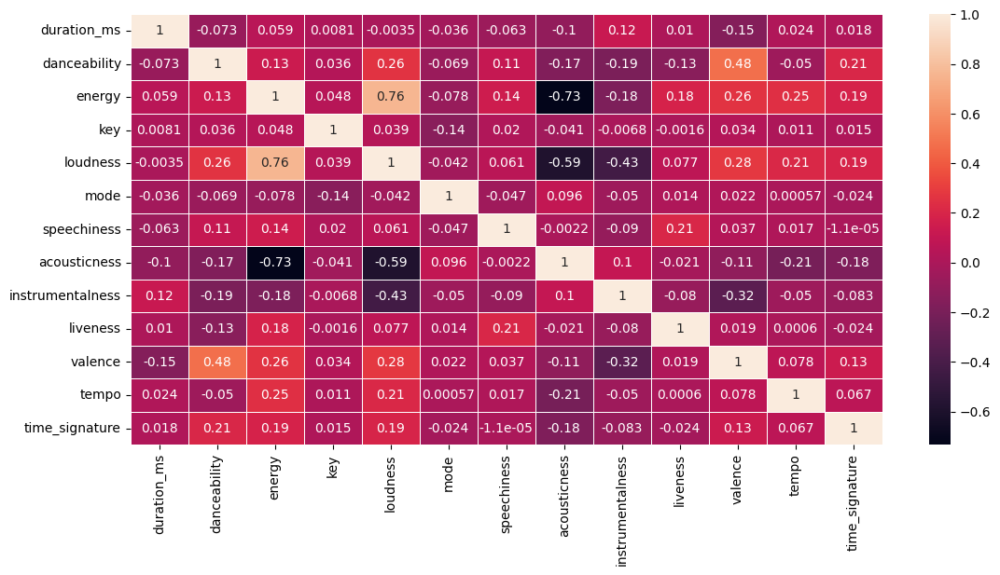

In [12]:
plt.figure(figsize=(13,6))
corr_matrix = df_nums.corr()
sn.heatmap(corr_matrix, linewidths=.7, annot=True)
plt.show()

**Energy and Loudness have the biggest correlations.**

## Setting up Training Data

In [13]:
df_train_full, df_test = train_test_split(df, test_size=0.2, random_state=1)
df_train, df_val = train_test_split(df_train_full, test_size=0.25, random_state=1)

df_train = df_train.reset_index(drop=True)
df_val = df_val.reset_index(drop=True)
df_test = df_test.reset_index(drop=True)

y_train = df_train.genre.values
y_val = df_val.genre.values
y_test = df_test.genre.values

del df_train['genre']
del df_val['genre']
del df_test['genre']

len(df_train), len(df_val), len(df_test)

(68400, 22800, 22800)

In [14]:
cols = df.select_dtypes(include=np.number).columns.tolist()
cols

['duration_ms',
 'danceability',
 'energy',
 'key',
 'loudness',
 'mode',
 'speechiness',
 'acousticness',
 'instrumentalness',
 'liveness',
 'valence',
 'tempo',
 'time_signature']

In [15]:
le = LabelEncoder()
y_train = le.fit_transform(y_train)
y_val = le.fit_transform(y_val)
y_test = le.fit_transform(y_test)

In [16]:
train_dicts = df_train[cols].to_dict(orient='records')

dv = DictVectorizer(sparse=False)
X_train = dv.fit_transform(train_dicts)

val_dict = df_val[cols].to_dict(orient='records')
X_val = dv.transform(val_dict)

In [17]:
classes = df.genre.unique()
print(classes)

['acoustic' 'afrobeat' 'alt-rock' 'alternative' 'ambient' 'anime'
 'black-metal' 'bluegrass' 'blues' 'brazil' 'breakbeat' 'british'
 'cantopop' 'chicago-house' 'children' 'chill' 'classical' 'club' 'comedy'
 'country' 'dance' 'dancehall' 'death-metal' 'deep-house' 'detroit-techno'
 'disco' 'disney' 'drum-and-bass' 'dub' 'dubstep' 'edm' 'electro'
 'electronic' 'emo' 'folk' 'forro' 'french' 'funk' 'garage' 'german'
 'gospel' 'goth' 'grindcore' 'groove' 'grunge' 'guitar' 'happy'
 'hard-rock' 'hardcore' 'hardstyle' 'heavy-metal' 'hip-hop' 'honky-tonk'
 'house' 'idm' 'indian' 'indie-pop' 'indie' 'industrial' 'iranian'
 'j-dance' 'j-idol' 'j-pop' 'j-rock' 'jazz' 'k-pop' 'kids' 'latin'
 'latino' 'malay' 'mandopop' 'metal' 'metalcore' 'minimal-techno' 'mpb'
 'new-age' 'opera' 'pagode' 'party' 'piano' 'pop-film' 'pop' 'power-pop'
 'progressive-house' 'psych-rock' 'punk-rock' 'punk' 'r-n-b' 'reggae'
 'reggaeton' 'rock-n-roll' 'rock' 'rockabilly' 'romance' 'sad' 'salsa'
 'samba' 'sertanejo' 'show

## Logistic Regression

In [18]:
model_lr = LogisticRegression(multi_class='ovr', solver='lbfgs', random_state=1)
model_lr.fit(X_train, y_train)

LogisticRegression(multi_class='ovr', random_state=1)

In [19]:
y_pred = model_lr.predict_proba(X_val)
roc_auc_score(y_val, y_pred, multi_class='ovr')

0.637139054348394

**Logistic Regression has a low score**

## Decision Tree Classifier

In [20]:
dt = DecisionTreeClassifier()
dt.fit(X_train, y_train)

DecisionTreeClassifier()

In [21]:
y_pred = dt.predict_proba(X_val)
roc_auc_score(y_val, y_pred, multi_class='ovr')

0.6085162651804611

In [22]:
dt = DecisionTreeClassifier(max_depth=2)
dt.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=2)

In [23]:
y_pred = dt.predict_proba(X_train)
auc = roc_auc_score(y_train, y_pred, multi_class='ovr')
print('train:', auc)

y_pred = dt.predict_proba(X_val)
auc = roc_auc_score(y_val, y_pred, multi_class='ovr')
print('val:', auc)

train: 0.5110544353040559
val: 0.5106760916708338


In [24]:
print(export_text(dt, feature_names=list(dv.get_feature_names_out())))

|--- speechiness <= 0.75
|   |--- valence <= 0.02
|   |   |--- class: 101
|   |--- valence >  0.02
|   |   |--- class: 41
|--- speechiness >  0.75
|   |--- liveness <= 0.27
|   |   |--- class: 18
|   |--- liveness >  0.27
|   |   |--- class: 18



In [25]:
depths = [ 5, 10, 15, 20, 25, 30, 40, 50, None]

for depth in depths: 
    dt = DecisionTreeClassifier(max_depth=depth)
    dt.fit(X_train, y_train)
    y_pred = dt.predict_proba(X_val)
    auc = roc_auc_score(y_val, y_pred, multi_class='ovr')
    
    print('%4s -> %.3f' % (depth, auc))

   5 -> 0.749
  10 -> 0.826
  15 -> 0.780
  20 -> 0.685
  25 -> 0.631
  30 -> 0.613
  40 -> 0.609
  50 -> 0.609
None -> 0.609


In [26]:
scores = []

for depth in [5, 7, 10, 12]:
    for s in [1, 5, 10, 15, 20, 500, 100, 200]:
        dt = DecisionTreeClassifier(max_depth=depth, min_samples_leaf=s)
        dt.fit(X_train, y_train)

        y_pred = dt.predict_proba(X_val)
        auc = roc_auc_score(y_val, y_pred, multi_class='ovr')
        
        scores.append((depth, s, auc))

In [27]:
columns = ['max_depth', 'min_samples_leaf', 'auc']
df_scores = pd.DataFrame(scores, columns=columns)

In [28]:
df_scores_pivot = df_scores.pivot(index='min_samples_leaf', columns=['max_depth'], values=['auc'])
df_scores_pivot.round(3)

auc                     
max_depth            5      7      10     12
min_samples_leaf                            
1                 0.749  0.798  0.826  0.819
5                 0.749  0.798  0.827  0.821
10                0.749  0.798  0.826  0.820
15                0.749  0.798  0.826  0.820
20                0.749  0.798  0.826  0.822
100               0.749  0.798  0.829  0.829
200               0.749  0.798  0.830  0.834
500               0.775  0.811  0.831  0.832

<AxesSubplot: xlabel='None-max_depth', ylabel='min_samples_leaf'>

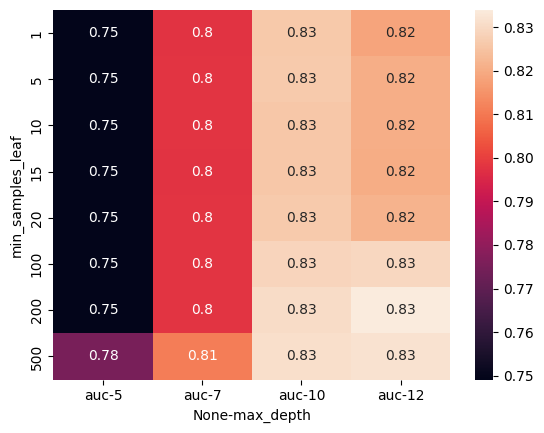

In [29]:
sn.heatmap(df_scores_pivot, annot=True)

In [30]:
dt = DecisionTreeClassifier(max_depth=12, min_samples_leaf=200)
dt.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=12, min_samples_leaf=200)

**Looks like the best parameters for Decision Tree are:**

* max_depth = 12
* min_samples_leaf = 200

In [31]:
print(export_text(dt, feature_names=list(dv.get_feature_names_out())))

|--- speechiness <= 0.75
|   |--- valence <= 0.02
|   |   |--- class: 101
|   |--- valence >  0.02
|   |   |--- instrumentalness <= 0.19
|   |   |   |--- acousticness <= 0.30
|   |   |   |   |--- danceability <= 0.62
|   |   |   |   |   |--- acousticness <= 0.00
|   |   |   |   |   |   |--- duration_ms <= 166632.00
|   |   |   |   |   |   |   |--- valence <= 0.34
|   |   |   |   |   |   |   |   |--- class: 42
|   |   |   |   |   |   |   |--- valence >  0.34
|   |   |   |   |   |   |   |   |--- valence <= 0.57
|   |   |   |   |   |   |   |   |   |--- class: 82
|   |   |   |   |   |   |   |   |--- valence >  0.57
|   |   |   |   |   |   |   |   |   |--- class: 82
|   |   |   |   |   |   |--- duration_ms >  166632.00
|   |   |   |   |   |   |   |--- valence <= 0.35
|   |   |   |   |   |   |   |   |--- speechiness <= 0.06
|   |   |   |   |   |   |   |   |   |--- instrumentalness <= 0.00
|   |   |   |   |   |   |   |   |   |   |--- class: 44
|   |   |   |   |   |   |   |   |   |--- instrume

## Random Forest Classifier

In [32]:
rf = RandomForestClassifier(random_state=1)
rf.fit(X_train, y_train)

RandomForestClassifier(random_state=1)

In [33]:
y_pred = rf.predict_proba(X_val)
roc_auc_score(y_val, y_pred, multi_class='ovr')

0.8498081421087489

**Tuning max_depth**

In [34]:
scores = []

for d in tqdm([5, 10, 15, 20]):
    for n in trange(10, 201, 10):
        rf = RandomForestClassifier(n_estimators=n,
                                    max_depth=d,
                                    random_state=1)
        rf.fit(X_train, y_train)

        y_pred = rf.predict_proba(X_val)
        auc = roc_auc_score(y_val, y_pred, multi_class='ovr')

        scores.append((d, n, auc))

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

In [35]:
columns = ['max_depth', 'n_estimators', 'auc']
df_scores = pd.DataFrame(scores, columns=columns)

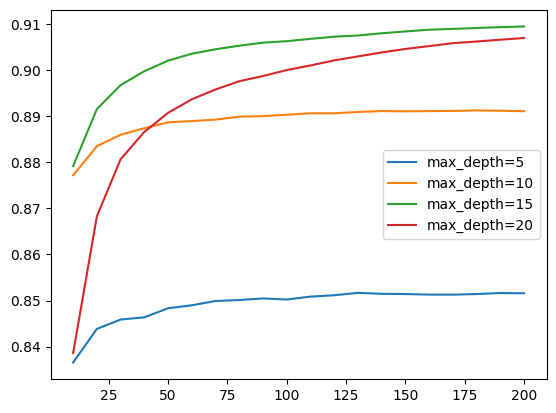

In [36]:
for d in [5, 10, 15, 20]:
    df_subset = df_scores[df_scores.max_depth == d]
    
    plt.plot(df_subset.n_estimators, df_subset.auc,
             label='max_depth=%d' % d)

plt.legend()

**Tuning min_samples_leaf**

In [37]:
max_depth = 15

In [38]:
scores = []

for s in tqdm([1, 3, 5, 10, 50]):
    for n in trange(10, 201, 10):
        rf = RandomForestClassifier(n_estimators=n,
                                    max_depth=max_depth,
                                    min_samples_leaf=s,
                                    random_state=1)
        rf.fit(X_train, y_train)

        y_pred = rf.predict_proba(X_val)
        auc = roc_auc_score(y_val, y_pred, multi_class='ovr')

        scores.append((s, n, auc))

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

In [39]:
columns = ['min_samples_leaf', 'n_estimators', 'auc']
df_scores = pd.DataFrame(scores, columns=columns)

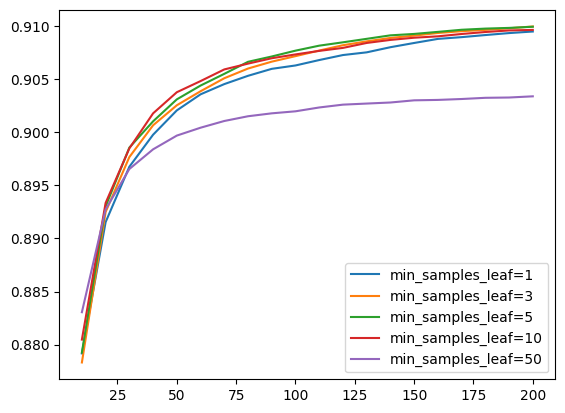

In [40]:
values = [1, 3, 5, 10, 50]

for s in values:
    df_subset = df_scores[df_scores.min_samples_leaf == s]
    
    plt.plot(df_subset.n_estimators, df_subset.auc,
             label='min_samples_leaf=%d' % s)

plt.legend()

In [41]:
min_samples_leaf = 5

In [42]:
rf = RandomForestClassifier(n_estimators=175,
                            max_depth=max_depth,
                            min_samples_leaf=min_samples_leaf,
                            random_state=1)
rf.fit(X_train, y_train)

RandomForestClassifier(max_depth=15, min_samples_leaf=5, n_estimators=175,
                       random_state=1)

**Looks like the best parameters for Random Forest are:**

* max_depth = 15
* min_samples_leaf = 5
* n_estimators = 175

# Selecting a Model

## Logistic Regression

In [43]:
model_lr = LogisticRegression(multi_class='ovr', solver='lbfgs', random_state=1)
model_lr.fit(X_train, y_train)

LogisticRegression(multi_class='ovr', random_state=1)

In [44]:
y_pred = model_lr.predict_proba(X_val)
roc_auc_score(y_val, y_pred, multi_class='ovr')

0.637139054348394

## Decision Tree

In [45]:
dt = DecisionTreeClassifier(max_depth=12, min_samples_leaf=200)
dt.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=12, min_samples_leaf=200)

In [46]:
y_pred = dt.predict_proba(X_val)
roc_auc_score(y_val, y_pred, multi_class='ovr')

0.8339303650301276

## Random Forest

In [47]:
rf = RandomForestClassifier(n_estimators=175,
                            max_depth=15,
                            min_samples_leaf=5,
                            random_state=1)
rf.fit(X_train, y_train)

RandomForestClassifier(max_depth=15, min_samples_leaf=5, n_estimators=175,
                       random_state=1)

In [48]:
y_pred = rf.predict_proba(X_val)
roc_auc_score(y_val, y_pred, multi_class='ovr')

0.9096518511724707

**Random Forest has the best accuracy**

## Training the model on the full dataset

In [49]:
df_train_full.head()

,duration_ms,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,genre
104483,235200,0.416,0.358,10,-8.535,1,0.0462,0.476000,0.000,0.1110,0.116,80.643,3,spanish
17411,187001,0.679,0.952,1,-2.777,1,0.0596,0.000017,0.686,0.5150,0.175,128.033,4,club
73414,324837,0.764,0.275,0,-11.795,0,0.0394,0.244000,0.731,0.2840,0.437,115.006,4,minimal-techno
95288,276533,0.763,0.809,0,-4.957,1,0.0458,0.224000,0.000,0.0803,0.689,86.606,4,salsa
77403,214840,0.545,0.684,7,-7.883,1,0.0455,0.650000,0.000,0.7140,0.800,160.098,4,pagode


In [50]:
df_train_full = df_train_full.reset_index(drop=True)

In [51]:
df_train_full.head()

,duration_ms,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,genre
0,235200,0.416,0.358,10,-8.535,1,0.0462,0.476000,0.000,0.1110,0.116,80.643,3,spanish
1,187001,0.679,0.952,1,-2.777,1,0.0596,0.000017,0.686,0.5150,0.175,128.033,4,club
2,324837,0.764,0.275,0,-11.795,0,0.0394,0.244000,0.731,0.2840,0.437,115.006,4,minimal-techno
3,276533,0.763,0.809,0,-4.957,1,0.0458,0.224000,0.000,0.0803,0.689,86.606,4,salsa
4,214840,0.545,0.684,7,-7.883,1,0.0455,0.650000,0.000,0.7140,0.800,160.098,4,pagode


In [52]:
y_train_full = df_train_full.genre.values

In [53]:
del df_train_full['genre']

In [54]:
dicts_train_full = df_train_full.to_dict(orient='records')

dv = DictVectorizer(sparse=False)
X_train_full = dv.fit_transform(dicts_train_full)

dicts_test = df_test.to_dict(orient='records')
X_test = dv.transform(dicts_test)

In [55]:
le = LabelEncoder()
y_train_full = le.fit_transform(y_train_full)

In [56]:
rf = RandomForestClassifier(n_estimators=175,
                            max_depth=15,
                            min_samples_leaf=5,
                            random_state=1)
rf.fit(X_train_full, y_train_full)

RandomForestClassifier(max_depth=15, min_samples_leaf=5, n_estimators=175,
                       random_state=1)

In [57]:
y_pred = rf.predict_proba(X_test)
roc_auc_score(y_test, y_pred, multi_class='ovr')

0.9153097641244282

In [58]:
df_train_full.iloc[3].to_dict()

{'duration_ms': 276533.0,
 'danceability': 0.763,
 'energy': 0.809,
 'key': 0.0,
 'loudness': -4.957,
 'mode': 1.0,
 'speechiness': 0.0458,
 'acousticness': 0.224,
 'instrumentalness': 0.0,
 'liveness': 0.0803,
 'valence': 0.689,
 'tempo': 86.606,
 'time_signature': 4.0}

In [59]:
print(classes[y_train_full[3]])

salsa


# Exporting Model

In [60]:
output_file = 'model.bin'

In [61]:
f_out = open(output_file, 'wb') 
pickle.dump((dv, rf), f_out)
f_out.close()